In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from tqdm import tqdm

import networkx as nx
import pyvis.network as net
from networkx import Graph

OPENSLIDE_PATH = r"D:\DataManage\openslide-win64-20231011\bin"
import os

if hasattr(os, "add_dll_directory"):
    # Windows
    with os.add_dll_directory(OPENSLIDE_PATH):
        import openslide
else:
    import openslide
from openslide.deepzoom import DeepZoomGenerator

tqdm.pandas()

# Utils

In [2]:
def get_preds(row, sig_names, inf_folder):
    wsi_pred = pd.read_csv(inf_folder / row.sample_ID / "wsi_pred.csv").iloc[0]
    wsi_pred = wsi_pred[sig_names]
    wsi_pred.rename(lambda x: x + "_pred", inplace=True)
    return wsi_pred.to_dict()

In [3]:
# Compute correlation between true and predicted values
def compute_coors(df, sig_names):
    corrs = {}
    for sig in sig_names:
        corrs[sig] = df[sig].corr(df[sig + "_pred"])
    coors = pd.DataFrame(corrs, index=["correlation"]).T
    coors.sort_values(by="correlation", ascending=False, inplace=True)
    return coors

In [4]:
# Display correlation
def display_correlation(coors, n_top=10, n_bottom=10, title="Correlation between true and predicted values"):
    plt.figure(figsize=(15, 10))
    head = coors.head(n_top)
    tail = coors.tail(n_bottom)
    both = pd.concat([head, tail])
    sns.barplot(x=both.correlation, y=both.index)
    plt.title(title)

In [5]:
# Correlation betwween true labels
def get_corr_mat(df, sig_names, n_neigh=1):
    corr_mat = df[sig_names].corr()
    # for each signature find its n_top most correlated signatures
    best_corr = {}
    sig = sig_names[0]
    if n_neigh == -1:
        n_neigh = len(sig_names) - 1
    for sig in sig_names:
        bst = corr_mat[sig].sort_values(ascending=False)
        bst = bst.head(n_neigh + 1)[1:]  # avoid self correlation
        bst = bst.to_dict()

        sig_dict_ = [{f"neigh_{i}": key, f"corr_{i}": val} for (i, (key, val)) in enumerate(bst.items())]
        sig_dict = {}
        for d in sig_dict_:
            sig_dict.update(d)

        best_corr[sig] = sig_dict

    best_corr = pd.DataFrame(best_corr).T
    best_corr.sort_values(by="corr_0", ascending=False, inplace=True)
    return best_corr

In [6]:
def get_network(best_corr, n_neigh, threshold=0.9):
    if n_neigh == -1:
        n_neigh = best_corr.shape[1] // 2
    graph = Graph()
    nt = net.Network()
    for _, row in best_corr.iterrows():
        graph.add_node(row.name)
        nt.add_node(row.name)
        for i in range(n_neigh):
            if row[f"corr_{i}"] > threshold:
                graph.add_node(row[f"neigh_{i}"])
                graph.add_edge(row.name, row[f"neigh_{i}"], weight=row[f"corr_{i}"])
                nt.add_node(row[f"neigh_{i}"])
                nt.add_edge(row.name, row[f"neigh_{i}"], value=row[f"corr_{i}"], title=row[f"corr_{i}"])
    return graph, nt

In [7]:
def split_connect_comp(graph):
    connect_comp = list(nx.components.connected_components(graph))
    connect_comp = [list(comp) for comp in connect_comp]
    valid_sign = []
    to_refine = []
    for conn_comp in connect_comp:
        if len(conn_comp) == 1:
            valid_sign.append(conn_comp[0])
        else:
            to_refine.append(conn_comp)

    return valid_sign, to_refine


def filter_sign(graph):
    S = []
    valid_sign = []
    for c in nx.connected_components(graph):
        if len(c) > 1:
            S.append(graph.subgraph(c).copy())
        else:
            valid_sign.append(c.pop())
    for subGraph in S:
        nx.closeness_centrality(subGraph)
        centrality_cc = pd.DataFrame(nx.closeness_centrality(subGraph), index=["closeness"]).T
        center_node = centrality_cc.idxmax().iloc[0]
        valid_sign.append(center_node)
    return valid_sign

In [8]:
def get_tum_tiles(row, tum_tresh, inf_folder):
    tiles_pred = pd.read_csv(inf_folder / row.sample_ID / "tiles.csv")
    tum_tiles = tiles_pred[tiles_pred.tum_pred > tum_tresh].copy()
    # tum_tiles.drop(columns="tum_pred", inplace=True)
    tum_tiles.rename(
        lambda x: x + "_pred" if x not in ["x", "y", "z", "tum_pred"] else x, axis=1, inplace=True
    )
    return tum_tiles


def get_tum_wsi_preds(row, tum_tresh, inf_folder):
    tum_tiles = get_tum_tiles(row, tum_tresh, inf_folder)
    tum_wsi = tum_tiles.drop(columns=["x", "y", "z"]).mean()
    tum_wsi.name = row.sample_ID
    tum_wsi = tum_wsi.to_dict()
    return tum_wsi

In [9]:
def display_tiles(pos_img, neg_img, sign):
    fig, axes = plt.subplots(3, 2 * 3, figsize=(9, 6))

    for i in range(3):
        for j in range(3):
            axes[i, j].imshow(pos_img[i * 3 + j])
            axes[i, j].axis("off")

    for i in range(3):
        for j in range(3):
            axes[i, j + 3].imshow(neg_img[i * 3 + j])
            axes[i, j + 3].axis("off")

    axes[0, 0].set_title("Top 9 tiles")
    axes[0, 3].set_title("Bottom 9 tiles")

    plt.suptitle(f"Top and bottom 9 tiles for {sign}")
    plt.tight_layout()
    plt.show()

# MDN

In [10]:
df_path_mdn = Path(r"C:\Users\inserm\Documents\histo_sign\dataset\mdn_summary_vst.csv")
inf_folder_mdn = Path(r"C:\Users\inserm\Documents\histo_sign\dataset\inference_mdn")

In [11]:
df_mdn = pd.read_csv(df_path_mdn)
df_mdn.tail(3)
sig_names_mdn = df_mdn.columns[9:].values
for k in range(0, len(sig_names_mdn)):
    if sig_names_mdn[k][-1] == ".":
        sig_names_mdn[k] = sig_names_mdn[k][:-1]
        df_mdn.rename(columns={sig_names_mdn[k] + ".": sig_names_mdn[k]}, inplace=True)

## Get slide level prediction

In [12]:
get_preds_mdn = lambda row: get_preds(row, sig_names_mdn, inf_folder_mdn)
res = df_mdn.progress_apply(get_preds_mdn, axis=1, result_type="expand")
df_mdn_wsi = pd.concat([df_mdn, res], axis=1)

100%|██████████| 405/405 [00:01<00:00, 310.01it/s]


In [13]:
corrs = compute_coors(df_mdn_wsi, sig_names_mdn)

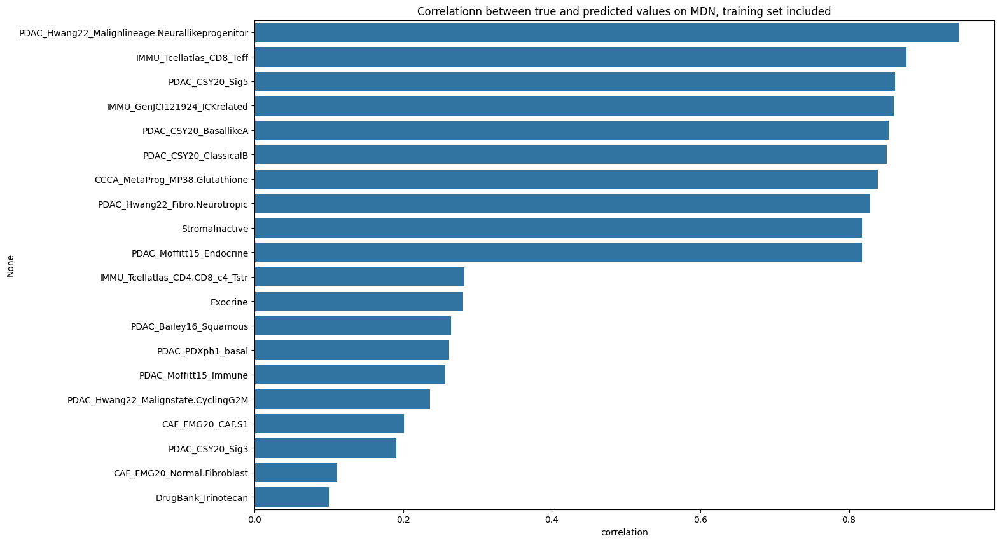

In [14]:
print("WARNING : The results include training samples. Do not use for evaluation")
display_correlation(
    corrs, title="Correlation between true and predicted values on MDN, training set included"
)

## Explore signature similitude

In [15]:
n_neigh = -1
threshold = 0.92
best_corr_mdn = get_corr_mat(df_mdn, sig_names_mdn, n_neigh=n_neigh)
best_corr_mdn

,neigh_0,corr_0,neigh_1,corr_1,neigh_2,corr_2,neigh_3,corr_3,neigh_4,corr_4,...,neigh_112,corr_112,neigh_113,corr_113,neigh_114,corr_114,neigh_115,corr_115,neigh_116,corr_116
PDAC_CSY20_Sig5,PDAC_Moffitt15_Endocrine,0.992254,CAF_FMG20_Normal.Fibroblast,0.987701,PDAC_Hwang22_Malignlineage.Neuroendocrinelike,0.984498,PDAC_Hwang22_Malignlineage.Neurallikeprogenitor,0.968159,CCCA_MetaProg_MP38.Glutathione,0.96686,...,StromaActivInflam,-0.090929,Classic,-0.108903,Immune,-0.123512,Basal,-0.140588,StromaActiv,-0.17116
PDAC_Moffitt15_Endocrine,PDAC_CSY20_Sig5,0.992254,CAF_FMG20_Normal.Fibroblast,0.982187,PDAC_CSY20_Sig12,0.976247,CCCA_MetaProg_MP38.Glutathione,0.971326,PDAC_Hwang22_Malignlineage.Neuroendocrinelike,0.969485,...,StromaActivInflam,-0.079269,Classic,-0.098747,Immune,-0.115207,Basal,-0.139823,StromaActiv,-0.166178
CAF_FMG20_Normal.Fibroblast,PDAC_CSY20_Sig5,0.987701,PDAC_Hwang22_Malignlineage.Neuroendocrinelike,0.98371,PDAC_Moffitt15_Endocrine,0.982187,PDAC_Hwang22_Malignlineage.Neurallikeprogenitor,0.971201,CCCA_MetaProg_MP38.Glutathione,0.966489,...,Endocrine,-0.068875,Classic,-0.116706,Immune,-0.118425,Basal,-0.155773,StromaActiv,-0.172846
PDAC_Hwang22_Malignstate.CyclingG2M,PDAC_Hwang22_Malignstate.CyclingS,0.985588,CCCA_MetaProg_MP2.Cell.Cycle.G1.S,0.904395,PDAC_PDXph1_basal,0.873082,IMMU_MCPcounter_Endothelial,0.862876,DrugBank_Irinotecan,0.862257,...,StromaInactive,-0.083171,StromaActivInflam,-0.084581,Basal,-0.195138,Classic,-0.219195,StromaActiv,-0.227494
PDAC_Hwang22_Malignstate.CyclingS,PDAC_Hwang22_Malignstate.CyclingG2M,0.985588,IMMU_MCPcounter_Endothelial,0.905473,CCCA_MetaProg_MP27.Oligo.Progenitor,0.897696,DrugBank_Irinotecan,0.896246,PDAC_Moffitt15_NormalStroma,0.894569,...,Immune,-0.07256,StromaActivInflam,-0.102055,Basal,-0.200787,Classic,-0.201751,StromaActiv,-0.225999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
StromaActivInflam,StromaActiv,0.39149,StromaInactive,0.332259,CCCA_MetaProg_MP5.Stress,0.307876,CCCA_MetaProg_MP19.Epithelial.Senescence,0.301383,IMMU_Tcellatlas_CD4.CD8_c4_Tstr,0.299014,...,PDAC_Hwang22_Malignlineage.Neurallikeprogenitor,-0.100582,PDAC_Hwang22_Malignstate.CyclingS,-0.102055,IMMU_MCPcounter_Fibroblasts,-0.117033,Endocrine,-0.288426,Classic,-0.338483
Endocrine,Classic,0.364963,Immune,0.142283,CAF_FMG20_IFNγ.iCAF,0.065335,IMMU_MCPcounter_Tcells,0.059444,Exocrine,0.052885,...,StromaActivInflam,-0.288426,CCCA_MetaProg_MP30.PDAC.classical,-0.294354,CCCA_MetaProg_MP40.PDAC.related,-0.32419,PDAC_PDAssigner_Classical,-0.401525,CCCA_MetaProg_MP19.Epithelial.Senescence,-0.451466
Classic,Endocrine,0.364963,IMMU_MCPcounter_Fibroblasts,0.074315,PDAC_Hwang22_Malignlineage.Mesenchymal,0.037609,CCCA_MetaProg_MP12.EMT.I,0.036521,Exocrine,0.030476,...,CCCA_MetaProg_MP1.Cell.Cycle.G2.M,-0.319597,PDAC_PDAssigner_QM,-0.32133,StromaActivInflam,-0.338483,PDAC_PDAssigner_Classical,-0.368762,CCCA_MetaProg_MP19.Epithelial.Senescence,-0.403988
StromaInactive,StromaActivInflam,0.332259,StromaActiv,0.306521,CAF_FMG20_detox.iCAF,0.289559,CCCA_MetaProg_MP19.Epithelial.Senescence,0.19216,PDAC_PDAssigner_Classical,0.17236,...,CCCA_MetaProg_MP12.EMT.I,-0.182038,Endocrine,-0.206257,CCCA_MetaProg_MP1.Cell.Cycle.G2.M,-0.227288,IMMU_MCPcounter_Fibroblasts,-0.233267,Classic,-0.256797


In [16]:
graph_mdn, net_mdn = get_network(best_corr_mdn, n_neigh=n_neigh, threshold=threshold)
net_mdn.show("network_mdn.html", notebook=False)

network_mdn.html


In [17]:
valid_sign_mdn = filter_sign(graph_mdn)
n_final, n_init = len(valid_sign_mdn), len(sig_names_mdn)
print(f"Ultimately there are {n_final} valid signatures that are independant enough over {n_init} signatures")

Ultimately there are 64 valid signatures that are independant enough over 118 signatures


In [18]:
filtered_corr_mdn = get_corr_mat(df_mdn, valid_sign_mdn, n_neigh=n_neigh)
graph_mdn, net_mdn = get_network(filtered_corr_mdn, n_neigh=n_neigh, threshold=0.8)
net_mdn.show("network_mdn_filtered.html", notebook=False)

network_mdn_filtered.html


# Prodige 24

In [51]:
df_path_p24 = Path(r"C:\Users\inserm\Documents\histo_sign\dataset\p24_summary_vst.csv")
inf_folder_p24 = Path(r"C:\Users\inserm\Documents\histo_sign\dataset\inference_p24")

In [52]:
df_p24 = pd.read_csv(df_path_p24)
sig_names_p24 = df_p24.columns[6:].values
for k in range(0, len(sig_names_p24)):
    if sig_names_p24[k][-1] == ".":
        sig_names_p24[k] = sig_names_p24[k][:-1]
        df_p24.rename(columns={sig_names_p24[k] + ".": sig_names_p24[k]}, inplace=True)

In [53]:
pd.Series(sig_names_mdn).isin(sig_names_p24).sum() == len(sig_names_mdn)

True

##  Slide level prediction

In [22]:
get_preds_p24 = lambda row: get_preds(row, sig_names_p24, inf_folder_p24)
res = df_p24.progress_apply(get_preds_p24, axis=1, result_type="expand")
df_p24_wsi = pd.concat([df_p24, res], axis=1)

100%|██████████| 359/359 [00:01<00:00, 249.01it/s]


In [23]:
corrs_p24 = compute_coors(df_p24_wsi, sig_names_p24)
corrs_p24

,correlation
StromaInactive,0.370677
StromaActiv,0.287487
PDAC_PDAssigner_Classical,0.272996
CAF_FMG20_Normal.Fibroblast,0.253335
CCCA_MetaProg_MP9.Unfolded.protein.response,0.234758
...,...
IMMU_Tcellatlas_CD4_Tn,-0.036803
PDAC_Bailey16_Immunogenic,-0.041436
PDAC_PDAssigner_Exocrine,-0.057346
PDAC_Bailey16_ADEX,-0.088518


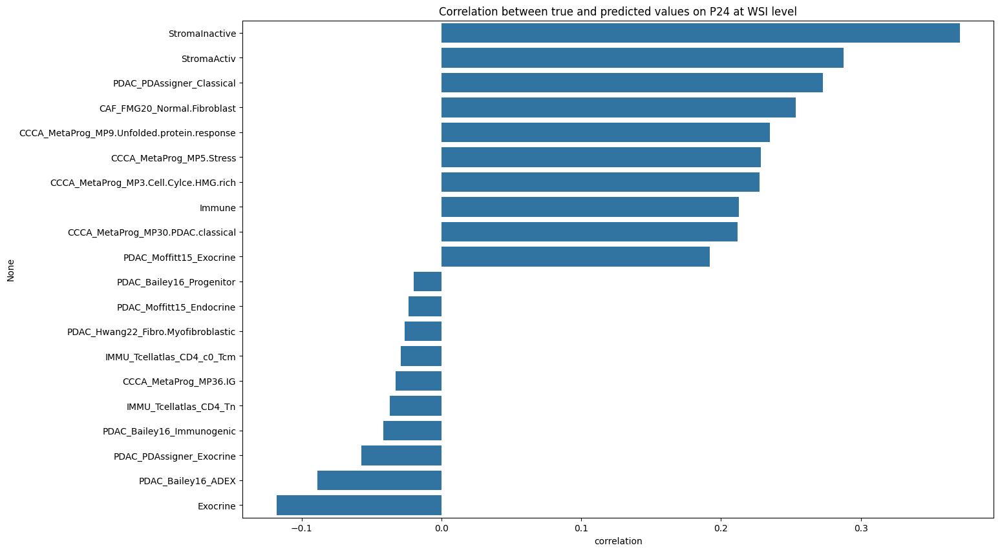

In [40]:
display_correlation(corrs_p24, title="Correlation between true and predicted values on P24 at WSI level")

## Tile level prediction

In [41]:
tum_tresh_p24 = 0.7

get_tum_wsi_preds_p24 = lambda row: get_tum_wsi_preds(row, tum_tresh_p24, inf_folder_p24)

res = df_p24.progress_apply(get_tum_wsi_preds_p24, axis=1, result_type="expand")
df_p24 = pd.concat([df_p24, res], axis=1)

100%|██████████| 359/359 [03:16<00:00,  1.83it/s]


In [54]:
df_p24 = pd.concat([df_p24, res], axis=1)

In [55]:
corrs = compute_coors(df_p24, sig_names_p24)
top_preds_sign = corrs[:10].index.to_list()
corrs

,correlation
StromaInactive,0.475480
StromaActiv,0.342567
Immune,0.280636
PDAC_PDAssigner_Classical,0.241808
Classic,0.232296
...,...
CAF_FMG20_IFNγ.iCAF,-0.019598
PDAC_Bailey16_Progenitor,-0.041035
IMMU_Tcellatlas_CD4_c1_Treg,-0.044624
IMMU_MCPcounter_Cytotox.lymph,-0.050776


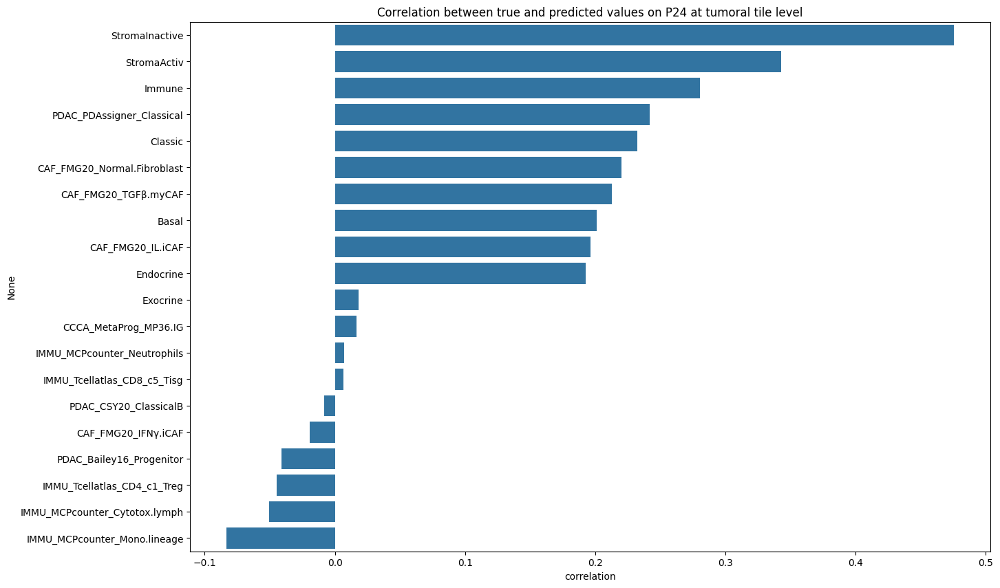

In [56]:
display_correlation(corrs, title="Correlation between true and predicted values on P24 at tumoral tile level")

##  Display tiles of interest

In [57]:
row = df_p24.iloc[np.random.randint(len(df_p24))]
row

Scan_HES                                                                     B191091_HES
ID_Nucleic_Acid                                                                MOSA312R2
patient_ID                                                                       B191091
path_svs                               C:\Users\inserm\Documents\histo_sign\dataset\P...
ID_scan                                                                      B191091_HES
                                                             ...                        
CCCA_MetaProg_MP26.NPC.Glioma_pred                                              0.839949
DrugBank_Irinotecan_pred                                                       -0.076415
CCCA_MetaProg_MP23.Secreted.II_pred                                             0.007005
PDAC_CSY20_Sig12_pred                                                           2.330129
tum_pred                                                                        0.865785
Name: 316, Length: 24

In [58]:
slide = openslide.OpenSlide(str(row.path_svs))
dz = DeepZoomGenerator(slide, tile_size=224, overlap=0)

In [59]:
tiles_pred = get_tum_tiles(row, 0.7, inf_folder_p24)

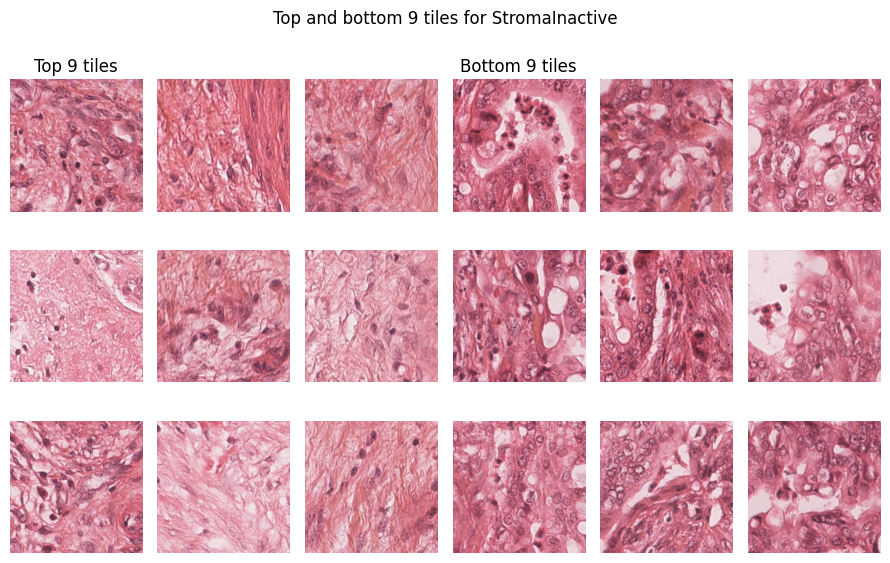

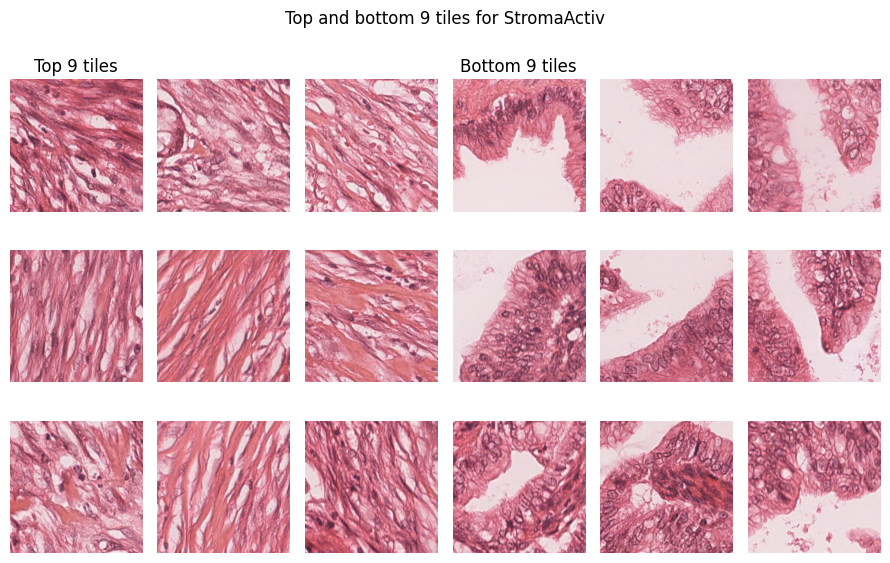

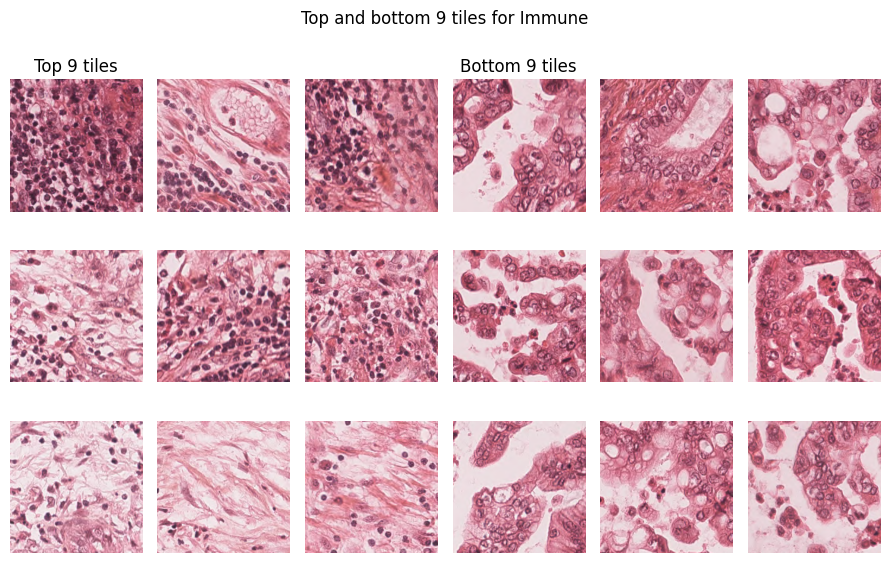

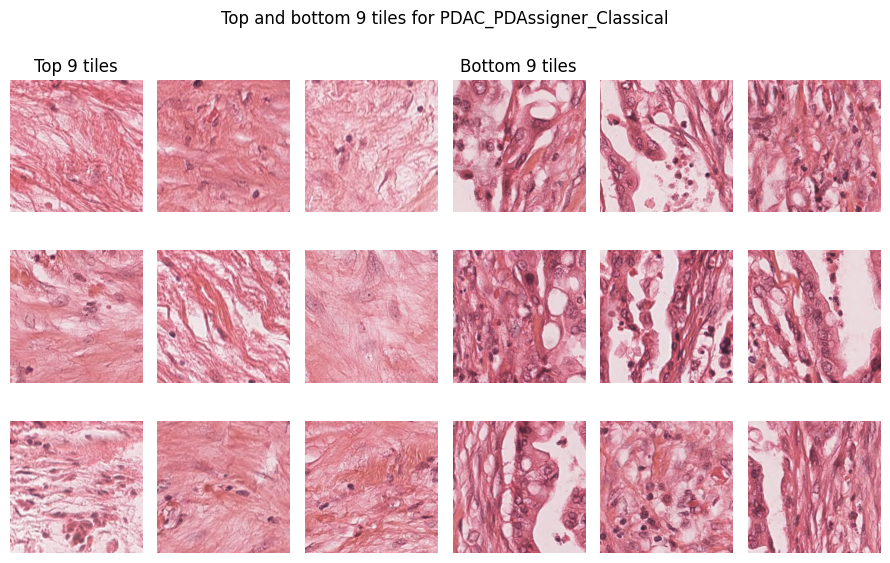

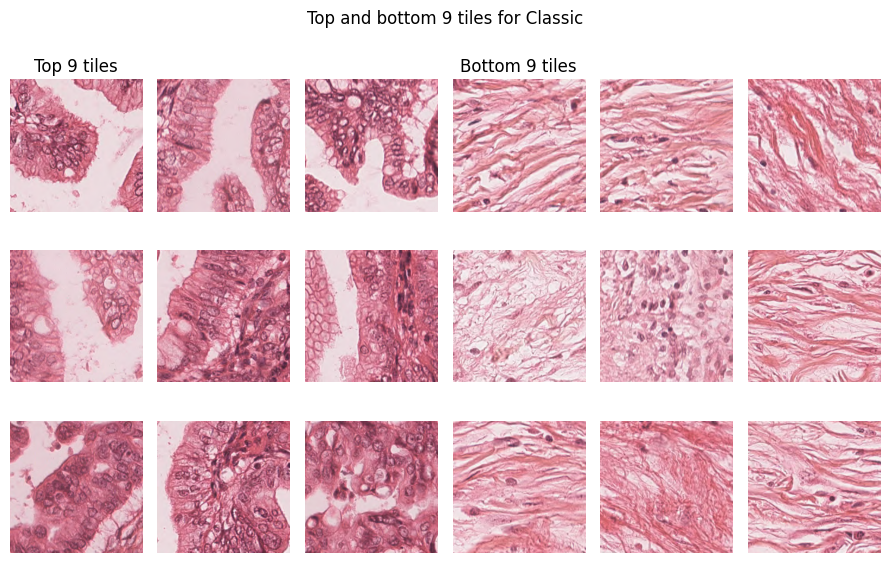

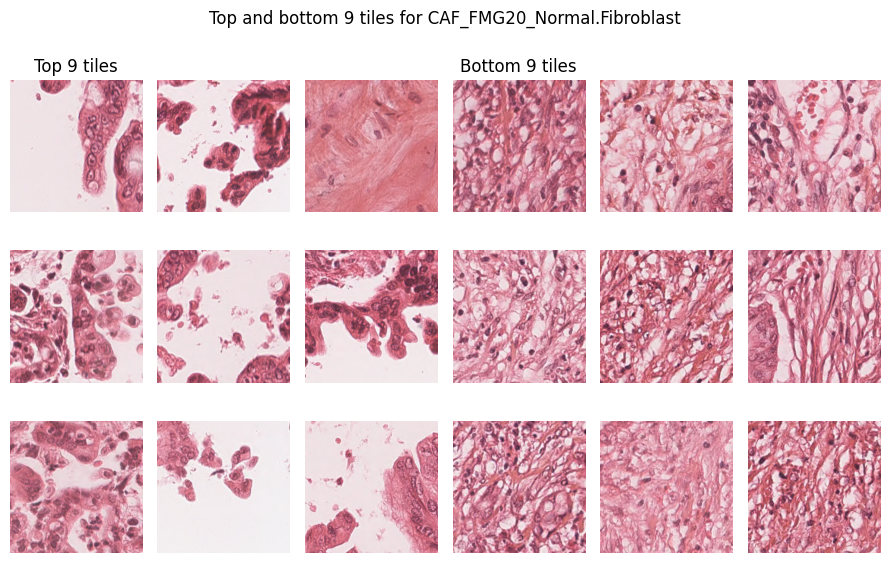

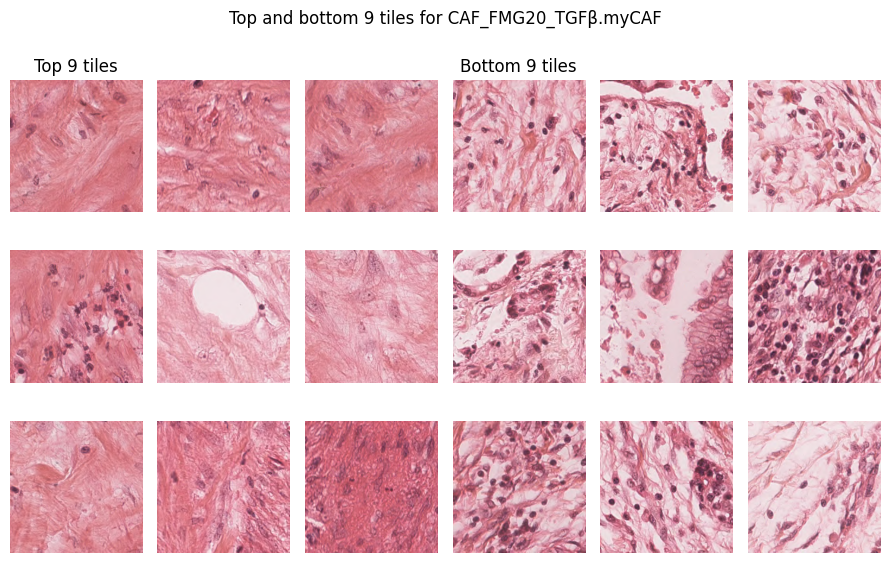

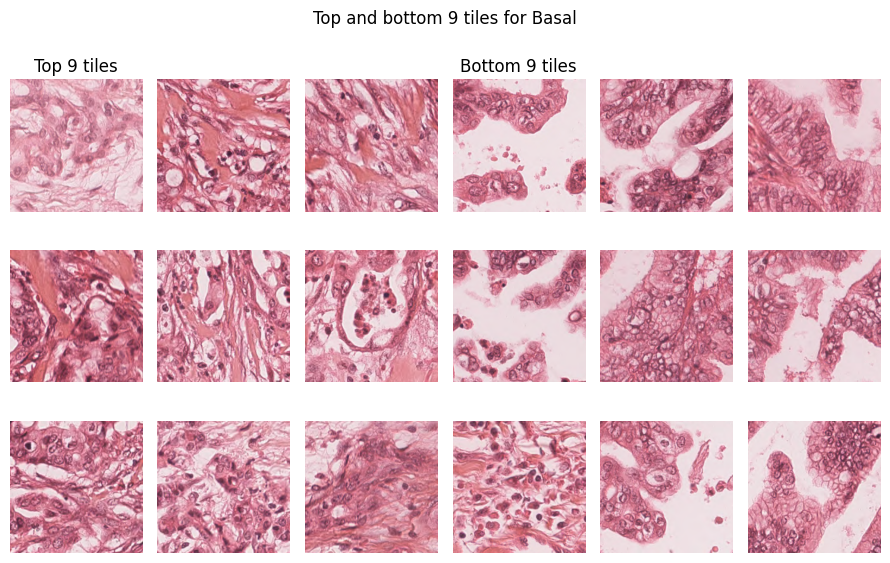

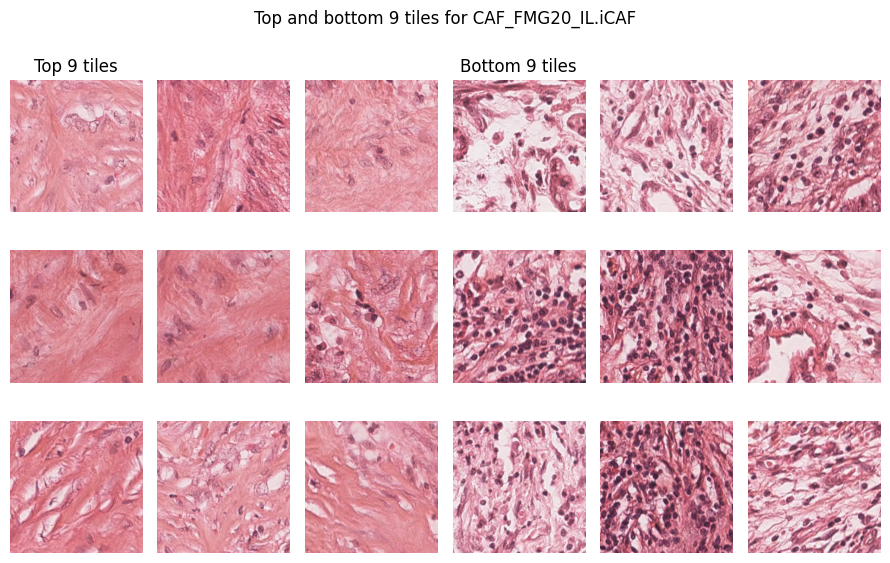

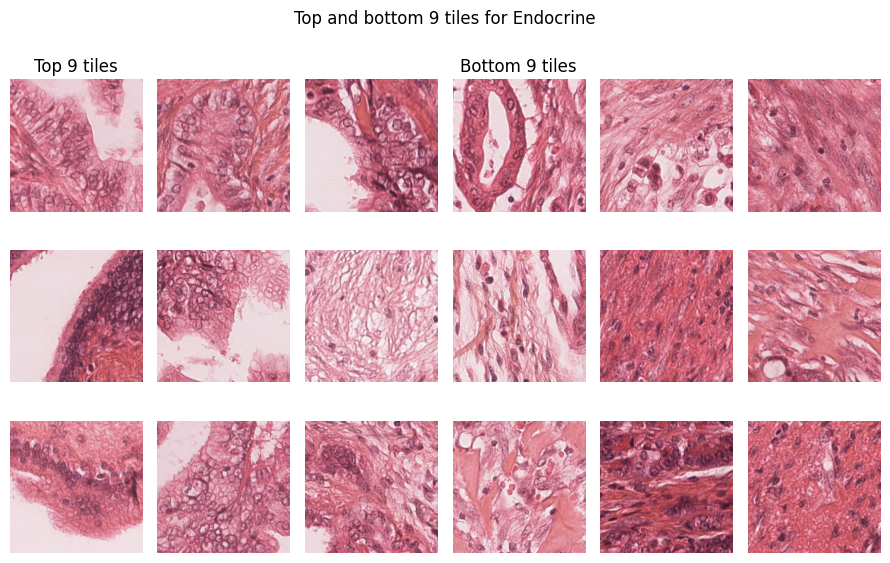

In [60]:
# for sign in valid_sign_mdn:
for sign in top_preds_sign:


    cols_of_interest = tiles_pred[["z", "x", "y", sign + "_pred"]]
    cols_of_interest = cols_of_interest.sort_values(by=sign + "_pred", ascending=False)

    top_tiles = cols_of_interest.head(9)
    bottom_tiles = cols_of_interest.tail(9)

    pos_img = [dz.get_tile(int(row.z), (int(row.x), int(row.y))) for _, row in top_tiles.iterrows()]
    neg_img = [dz.get_tile(int(row.z), (int(row.x), int(row.y))) for _, row in bottom_tiles.iterrows()]

    display_tiles(pos_img, neg_img, sign)

# Multicentric

In [61]:
df_path_panc = Path(r"C:\Users\inserm\Documents\histo_sign\dataset\panc_summary_vst.csv")
inf_folder_panc = Path(r"C:\Users\inserm\Documents\histo_sign\dataset\inference_panc")

In [62]:
df_panc = pd.read_csv(df_path_panc)
df_panc.drop(
    columns=[
        "molgrad",
        "soustype",
        "purist",
        "Scorepurist",
        "ClearBasalClassical",
    ],
    inplace=True,
)
composantes_cols = df_panc.filter(like="composantes.", axis=1).columns
df_panc.drop(columns=composantes_cols, inplace=True)
sig_names_panc = df_panc.columns[6:].values
for k in range(0, len(sig_names_panc)):
    if sig_names_panc[k][-1] == ".":
        sig_names_panc[k] = sig_names_panc[k][:-1]
        df_panc.rename(columns={sig_names_panc[k] + ".": sig_names_panc[k]}, inplace=True)
    elif sig_names_panc[k].startswith("composantes."):
        sig_names_panc[k] = sig_names_panc[k].replace("composantes.", "")
        df_panc.rename(columns={sig_names_panc[k] + ".": sig_names_panc[k]}, inplace=True)
    elif sig_names_panc[k] == "IMMU_Tcellatlas_CD4/CD8_c4_Tstr":
        sig_names_panc[k] = "IMMU_Tcellatlas_CD4.CD8_c4_Tstr"
        df_panc.rename(columns={"IMMU_Tcellatlas_CD4/CD8_c4_Tstr": sig_names_panc[k]}, inplace=True)

In [63]:
pd.Series(sig_names_mdn).isin(sig_names_p24).sum() == len(sig_names_mdn)

True

## Slide level prediction

In [64]:
get_preds_panc = lambda row: get_preds(row, sig_names_panc, inf_folder_panc)
res = df_panc.progress_apply(get_preds_panc, axis=1, result_type="expand")
df_panc_wsi = pd.concat([df_panc, res], axis=1)

100%|██████████| 732/732 [00:02<00:00, 282.87it/s]


In [65]:
corrs_panc = compute_coors(df_panc_wsi, sig_names_panc)

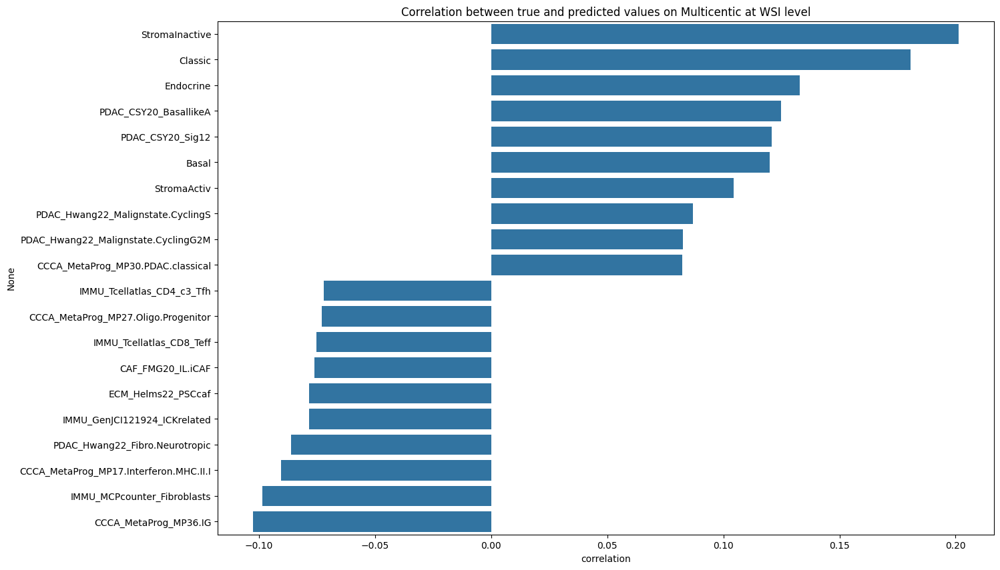

In [66]:
# Display correlation
display_correlation(
    corrs_panc, title="Correlation between true and predicted values on Multicentic at WSI level"
)

## Tile level prediction

In [67]:
tum_tresh_panc = 0.7

get_tum_wsi_preds_panc = lambda row: get_tum_wsi_preds(row, tum_tresh_panc, inf_folder_panc)

res = df_panc.progress_apply(get_tum_wsi_preds_panc, axis=1, result_type="expand")
df_panc = pd.concat([df_panc, res], axis=1)

 39%|███▉      | 285/732 [02:36<05:19,  1.40it/s]

In [ ]:
df_panc = pd.concat([df_panc, res], axis=1)

In [ ]:
corrs = compute_coors(df_panc, sig_names_panc)
corrs

,correlation
StromaInactive,0.201235
Classic,0.180577
Endocrine,0.132884
PDAC_CSY20_BasallikeA,0.124754
PDAC_CSY20_Sig12,0.120780
...,...
IMMU_GenJCI121924_ICKrelated,-0.078550
PDAC_Hwang22_Fibro.Neurotropic,-0.086284
CCCA_MetaProg_MP17.Interferon.MHC.II.I,-0.090475
IMMU_MCPcounter_Fibroblasts,-0.098701


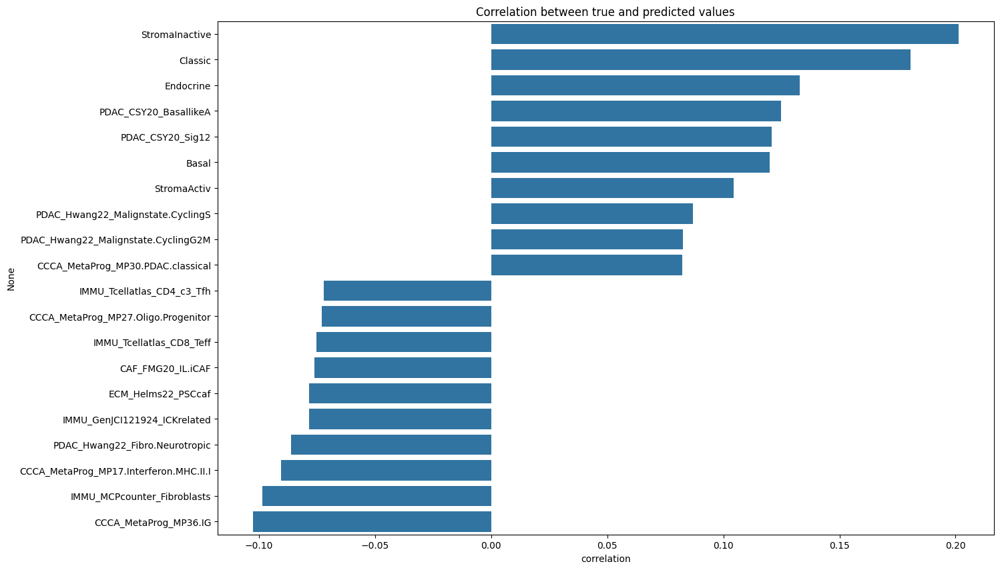

In [ ]:
display_correlation(
    corrs, title="Correlation between true and predicted values on Multicentic at tumoral tiles level"
)